# Name = Divyanshu_singh

# Batch = DS2306

# .

.

.

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns

import plotly.offline as py
import plotly.graph_objs as go
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.experimental import enable_iterative_imputer

from sklearn.preprocessing import OneHotEncoder,StandardScaler
from sklearn.impute import KNNImputer,IterativeImputer,SimpleImputer
from sklearn.model_selection import GridSearchCV , RandomizedSearchCV


import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('Automobile_insurance_fraud.csv')
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [3]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [5]:
# In _c39 all of it is nan so we are going to delete it
df=df.drop('_c39',axis=1)

In [6]:
# instead of nan '?' is present we treat it as nan values
df=df.replace('?',np.nan)
df.isnull().sum()

months_as_customer               0
age                              0
policy_number                    0
policy_bind_date                 0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_date                    0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries     

In [7]:
df.dropna()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
5,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,478456,...,2,NO,64100,6410,6410,51280,Saab,95,2003,Y
8,27,33,485665,05-02-1997,IL,100/300,500,1442.99,0,601734,...,1,YES,27700,2770,2770,22160,Toyota,Camry,2012,N
11,447,61,214618,29-05-1999,OH,100/300,2000,1137.16,0,615561,...,2,YES,114920,17680,17680,79560,Audi,A3,2006,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
980,245,40,908935,11-12-2009,IL,500/1000,1000,1361.45,0,604833,...,2,YES,82170,7470,7470,67230,Suburu,Forrestor,1999,N
984,163,36,974522,27-01-2000,IN,250/500,1000,1503.21,0,448190,...,1,NO,51390,5710,11420,34260,Toyota,Corolla,2013,N
988,295,46,591269,09-01-1999,IN,100/300,500,1672.88,0,478947,...,1,NO,60700,12140,6070,42490,Honda,Civic,1997,N
991,257,44,109392,12-07-2006,OH,100/300,1000,1280.88,0,433981,...,1,NO,46980,0,5220,41760,Accura,TL,2002,N


In [8]:
# Close to 70% of data is lost by deleting the nan rows

In [9]:
df.collision_type.value_counts()

Rear Collision     292
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64

In [10]:
df.property_damage.value_counts()

NO     338
YES    302
Name: property_damage, dtype: int64

In [11]:
df.police_report_available.value_counts()

NO     343
YES    314
Name: police_report_available, dtype: int64

In [12]:
# In all these Three column values are equally distributed so we can't fill the missing values with mode.

In [13]:
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,0,NaN,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,1,NaN,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,3,NaN,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


In [14]:
for col in df.columns:
    print(col," : ",len(df[col].unique()))

months_as_customer  :  391
age  :  46
policy_number  :  1000
policy_bind_date  :  951
policy_state  :  3
policy_csl  :  3
policy_deductable  :  3
policy_annual_premium  :  991
umbrella_limit  :  11
insured_zip  :  995
insured_sex  :  2
insured_education_level  :  7
insured_occupation  :  14
insured_hobbies  :  20
insured_relationship  :  6
capital-gains  :  338
capital-loss  :  354
incident_date  :  60
incident_type  :  4
collision_type  :  4
incident_severity  :  4
authorities_contacted  :  5
incident_state  :  7
incident_city  :  7
incident_location  :  1000
incident_hour_of_the_day  :  24
number_of_vehicles_involved  :  4
property_damage  :  3
bodily_injuries  :  3
witnesses  :  4
police_report_available  :  3
total_claim_amount  :  763
injury_claim  :  638
property_claim  :  626
vehicle_claim  :  726
auto_make  :  14
auto_model  :  39
auto_year  :  21
fraud_reported  :  2


In [15]:
df=df.drop(['police_report_available','property_damage'],axis=1)

In [16]:
df = df.dropna()

<Axes: xlabel='policy_state', ylabel='count'>

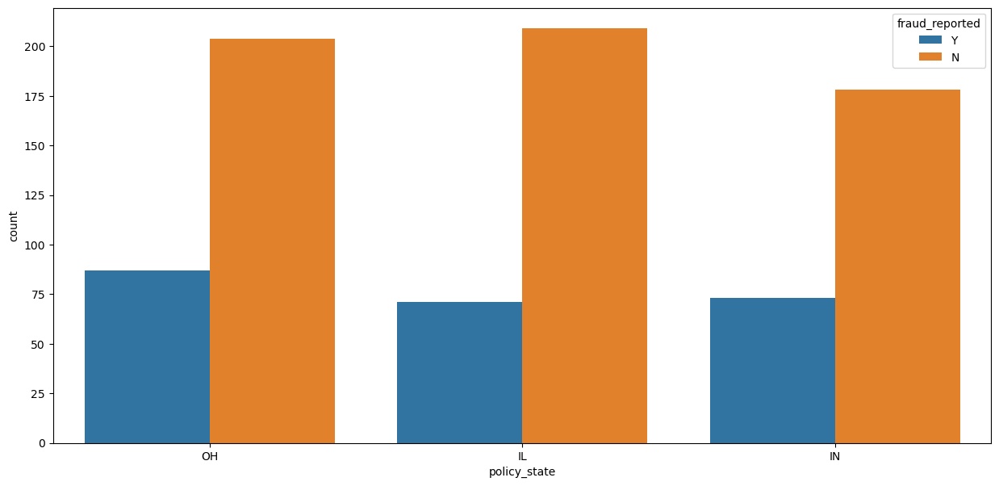

In [17]:
plt.figure(figsize=(15,7))
sns.countplot(x="policy_state",hue='fraud_reported',data=df)

<Axes: xlabel='policy_csl', ylabel='count'>

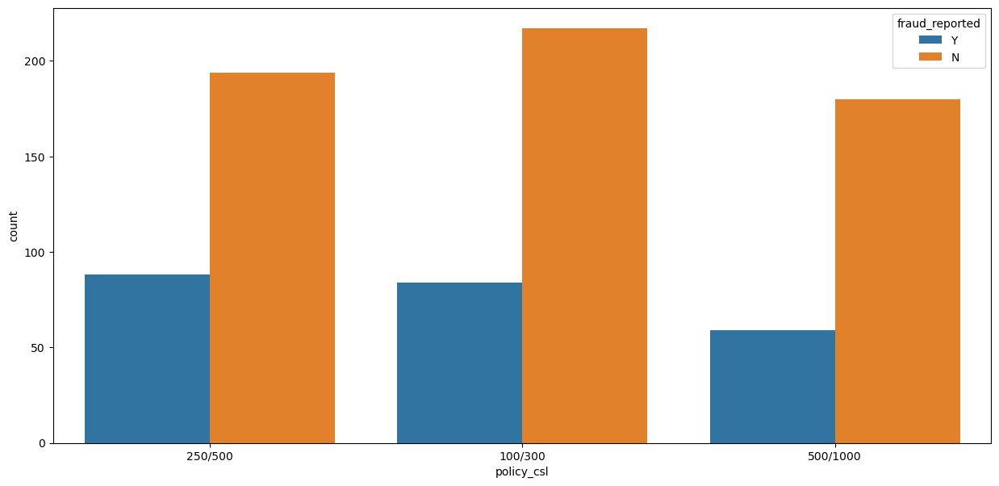

In [18]:
plt.figure(figsize=(15,7))
sns.countplot(x="policy_csl",hue='fraud_reported',data=df)

<Axes: xlabel='policy_deductable', ylabel='count'>

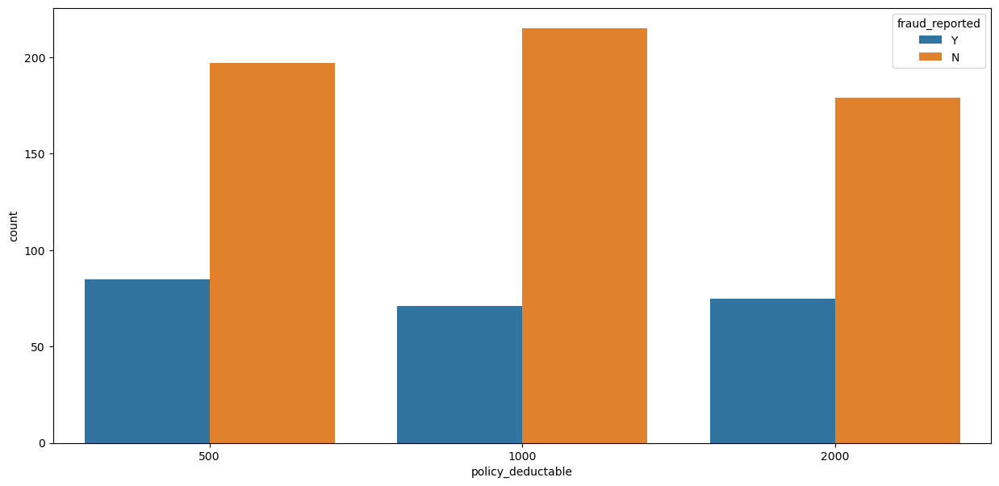

In [19]:
plt.figure(figsize=(15,7))
sns.countplot(x="policy_deductable",hue='fraud_reported',data=df)

<Axes: xlabel='insured_sex', ylabel='count'>

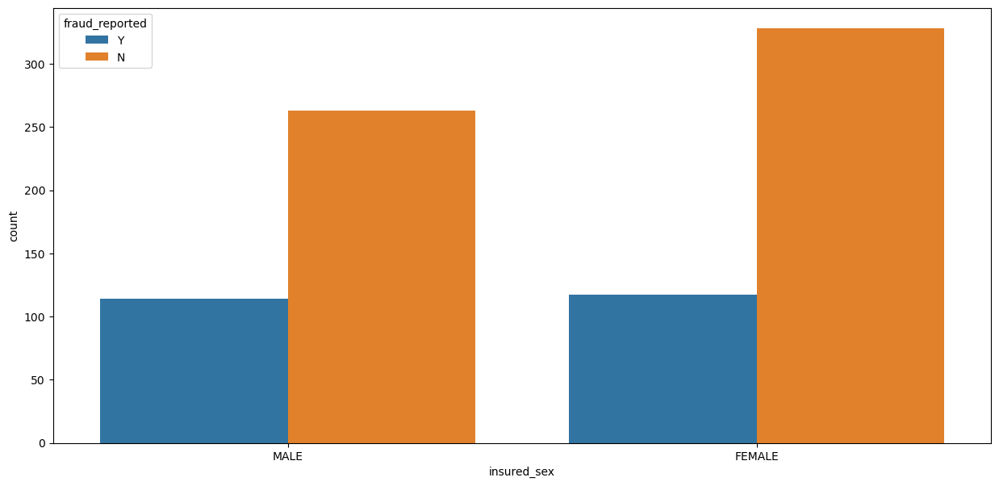

In [20]:
plt.figure(figsize=(15,7))
sns.countplot(x="insured_sex",hue='fraud_reported',data=df)

<Axes: xlabel='insured_education_level', ylabel='count'>

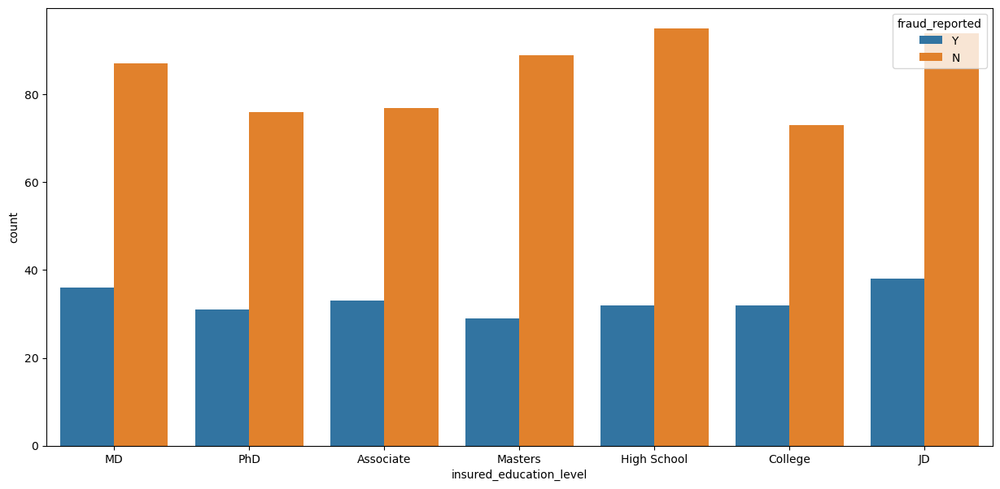

In [21]:
plt.figure(figsize=(15,7))
sns.countplot(x="insured_education_level",hue='fraud_reported',data=df)

<Axes: xlabel='insured_relationship', ylabel='count'>

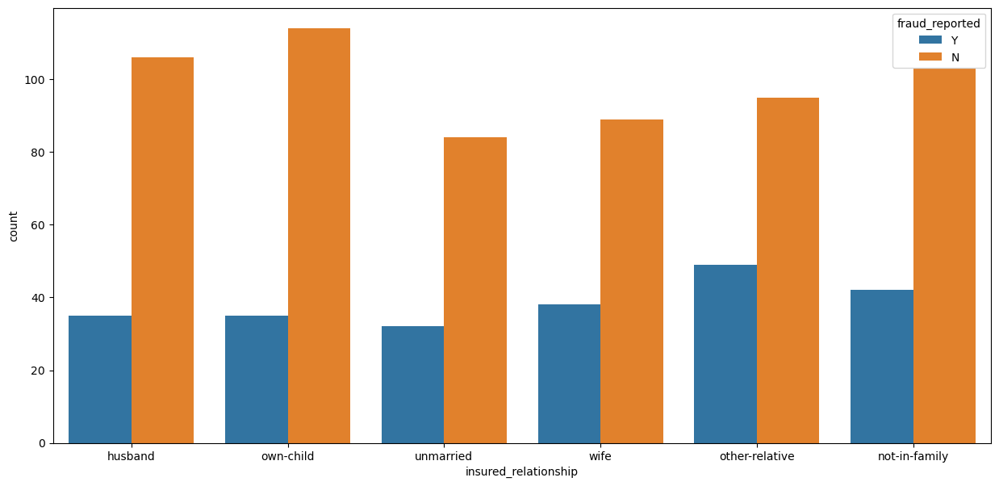

In [22]:
plt.figure(figsize=(15,7))
sns.countplot(x="insured_relationship",hue='fraud_reported',data=df)

<Axes: xlabel='incident_type', ylabel='count'>

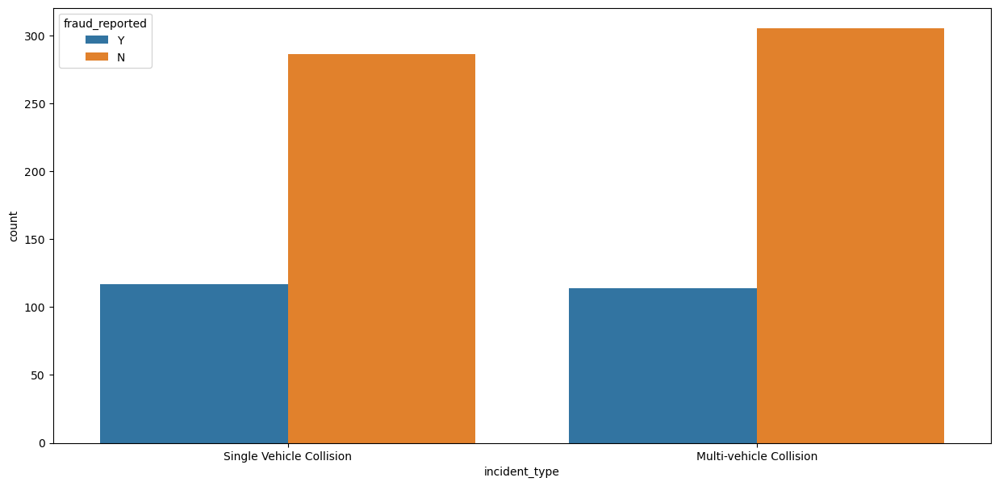

In [23]:
plt.figure(figsize=(15,7))
sns.countplot(x="incident_type",hue='fraud_reported',data=df)

<Axes: xlabel='collision_type', ylabel='count'>

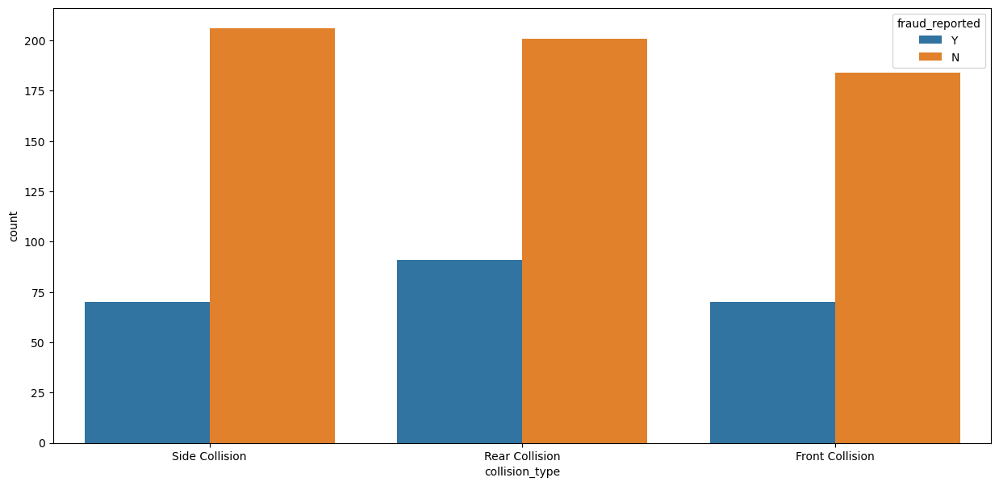

In [24]:
plt.figure(figsize=(15,7))
sns.countplot(x="collision_type",hue='fraud_reported',data=df)

<Axes: xlabel='incident_severity', ylabel='count'>

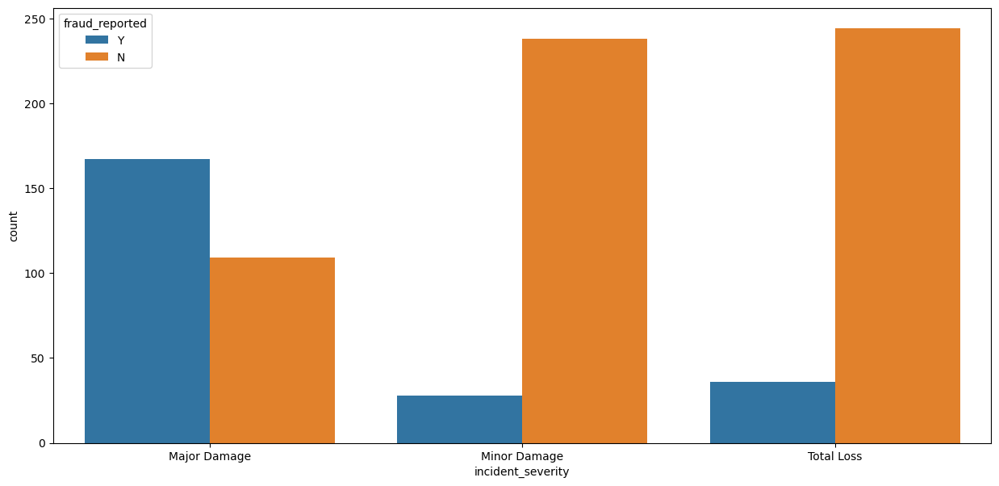

In [25]:
plt.figure(figsize=(15,7))
sns.countplot(x="incident_severity",hue='fraud_reported',data=df)

<Axes: xlabel='bodily_injuries', ylabel='count'>

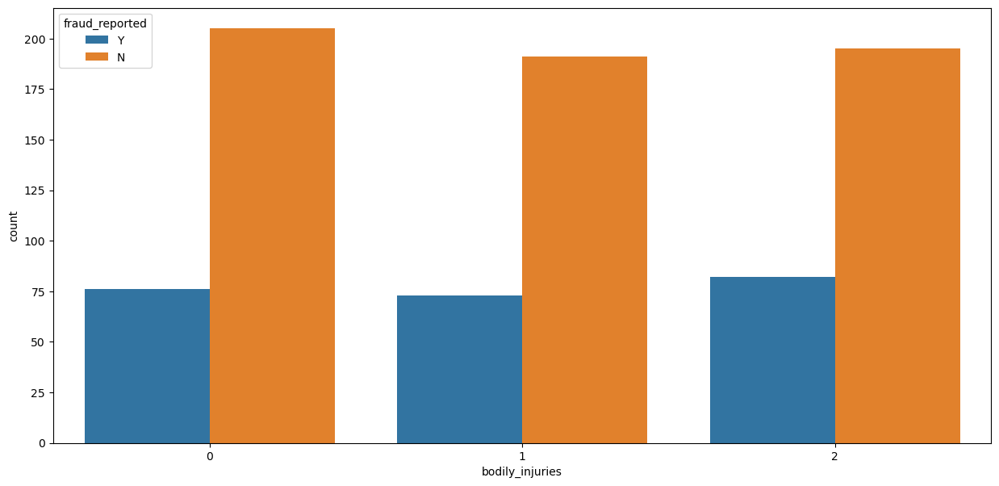

In [26]:
plt.figure(figsize=(15,7))
sns.countplot(x="bodily_injuries",hue='fraud_reported',data=df)

In [27]:
df1 = df.copy()

In [28]:
df1.collision_type = pd.factorize(df1.collision_type)[0]
df1.policy_state = pd.factorize(df1.policy_state)[0]
df1.policy_csl = pd.factorize(df1.policy_csl)[0]
df1.insured_sex = pd.factorize(df1.insured_sex)[0]
df1.insured_education_level = pd.factorize(df1.insured_education_level)[0]
df1.insured_hobbies = pd.factorize(df1.insured_hobbies)[0]
df1.insured_relationship = pd.factorize(df1.insured_relationship)[0]
df1.incident_date = pd.factorize(df1.incident_date)[0]
df1.incident_type = pd.factorize(df1.incident_type)[0]
df1.incident_severity = pd.factorize(df1.incident_severity)[0]
df1.authorities_contacted = pd.factorize(df1.authorities_contacted)[0]
df1.incident_state = pd.factorize(df1.incident_state)[0]
df1.incident_city = pd.factorize(df1.incident_city)[0]


df1.auto_make = pd.factorize(df1.auto_make)[0]
df1.auto_model = pd.factorize(df1.auto_model)[0]
df1.fraud_reported = pd.factorize(df1.fraud_reported)[0]

In [29]:
df1.insured_occupation = pd.factorize(df1.insured_occupation)[0]

In [30]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 822 entries, 0 to 998
Data columns (total 37 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           822 non-null    int64  
 1   age                          822 non-null    int64  
 2   policy_number                822 non-null    int64  
 3   policy_bind_date             822 non-null    object 
 4   policy_state                 822 non-null    int64  
 5   policy_csl                   822 non-null    int64  
 6   policy_deductable            822 non-null    int64  
 7   policy_annual_premium        822 non-null    float64
 8   umbrella_limit               822 non-null    int64  
 9   insured_zip                  822 non-null    int64  
 10  insured_sex                  822 non-null    int64  
 11  insured_education_level      822 non-null    int64  
 12  insured_occupation           822 non-null    int64  
 13  insured_hobbies     

In [31]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
months_as_customer,822.0,2.063345e+02,1.165758e+02,0.00,118.2500,202.50,279.000,479.00
age,822.0,3.914355e+01,9.298086e+00,19.00,32.0000,38.00,45.000,64.00
policy_number,822.0,5.443913e+05,2.563126e+05,100804.00,337287.7500,528165.00,756357.750,999435.00
policy_state,822.0,9.513382e-01,8.110485e-01,0.00,0.0000,1.00,2.000,2.00
policy_csl,822.0,9.476886e-01,7.948913e-01,0.00,0.0000,1.00,2.000,2.00
policy_deductable,822.0,1.137470e+03,6.134564e+02,500.00,500.0000,1000.00,2000.000,2000.00
policy_annual_premium,822.0,1.258253e+03,2.453058e+02,484.67,1090.1025,1260.92,1413.045,2047.59
umbrella_limit,822.0,1.052311e+06,2.247410e+06,-1000000.00,0.0000,0.00,0.000,10000000.00
insured_zip,822.0,4.996498e+05,7.108373e+04,430141.00,448031.7500,466134.50,602493.750,620962.00
insured_sex,822.0,5.413625e-01,4.985896e-01,0.00,0.0000,1.00,1.000,1.00


In [32]:
df1.skew()

months_as_customer             0.358615
age                            0.456474
policy_number                  0.044462
policy_state                   0.089107
policy_csl                     0.093662
policy_deductable              0.471738
policy_annual_premium          0.062558
umbrella_limit                 1.883676
insured_zip                    0.869685
insured_sex                   -0.166323
insured_education_level       -0.036463
insured_occupation             0.017305
insured_hobbies                0.067212
insured_relationship          -0.005996
capital-gains                  0.446492
capital-loss                  -0.380607
incident_date                  0.005827
incident_type                 -0.039008
collision_type                 0.048393
incident_severity             -0.009019
authorities_contacted          0.055800
incident_state                 0.354973
incident_city                  0.067561
incident_hour_of_the_day      -0.278561
number_of_vehicles_involved    0.161676


In [33]:
sns.set(font_scale=1.5)

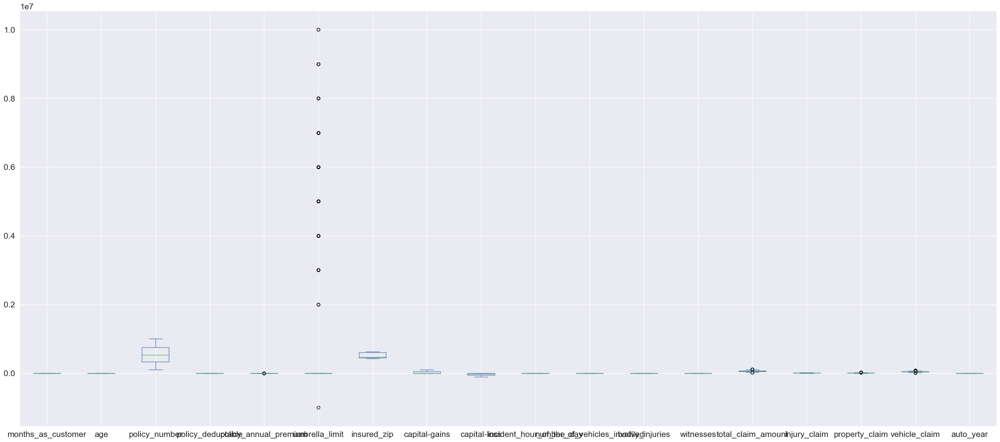

In [34]:
df.plot(kind='box',figsize=(35,15))
sns.set(font_scale=1.5)

In [35]:
sns.set(font_scale=3)

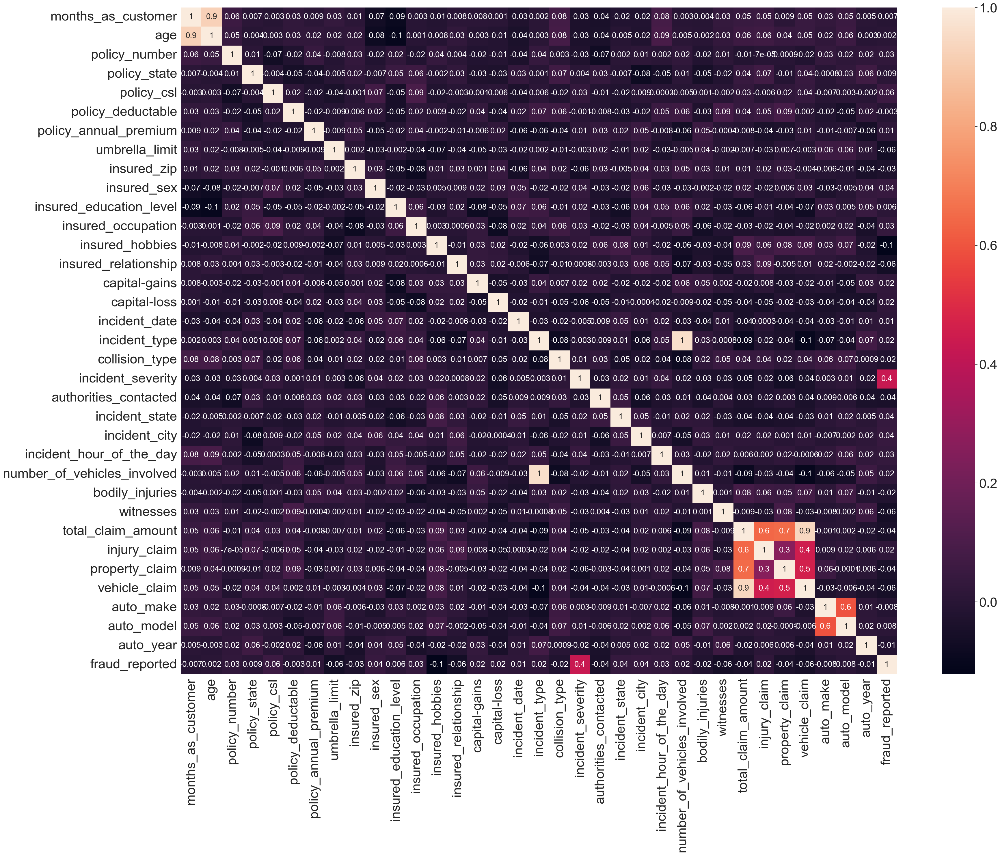

In [36]:
plt.figure(figsize=(40,30))
sns.heatmap(df1.corr(),fmt='.1g',annot=True,annot_kws={'fontsize':20})
sns.set(font_scale=3)

In [37]:
# age is highly correlated with months_as_customer
df1=df1.drop(['policy_bind_date','incident_location','months_as_customer','injury_claim','property_claim','collision_type'],axis=1)

In [38]:
df1.corr()['fraud_reported']

age                            0.001503
policy_number                  0.025619
policy_state                   0.009213
policy_csl                     0.057631
policy_deductable             -0.003287
policy_annual_premium          0.014648
umbrella_limit                -0.061353
insured_zip                   -0.029904
insured_sex                    0.043750
insured_education_level        0.005662
insured_occupation             0.033637
insured_hobbies               -0.121406
insured_relationship          -0.060825
capital-gains                  0.024670
capital-loss                   0.020435
incident_date                  0.014843
incident_type                  0.020292
incident_severity              0.434799
authorities_contacted         -0.043548
incident_state                 0.036407
incident_city                  0.040873
incident_hour_of_the_day       0.034958
number_of_vehicles_involved    0.015072
bodily_injuries               -0.023402
witnesses                     -0.056957


In [39]:
df1=df1.drop(['age','policy_state','policy_deductable','insured_education_level','auto_make','auto_model'],axis=1)
# these do not contribute to target column

In [40]:
df1=df1.drop_duplicates()

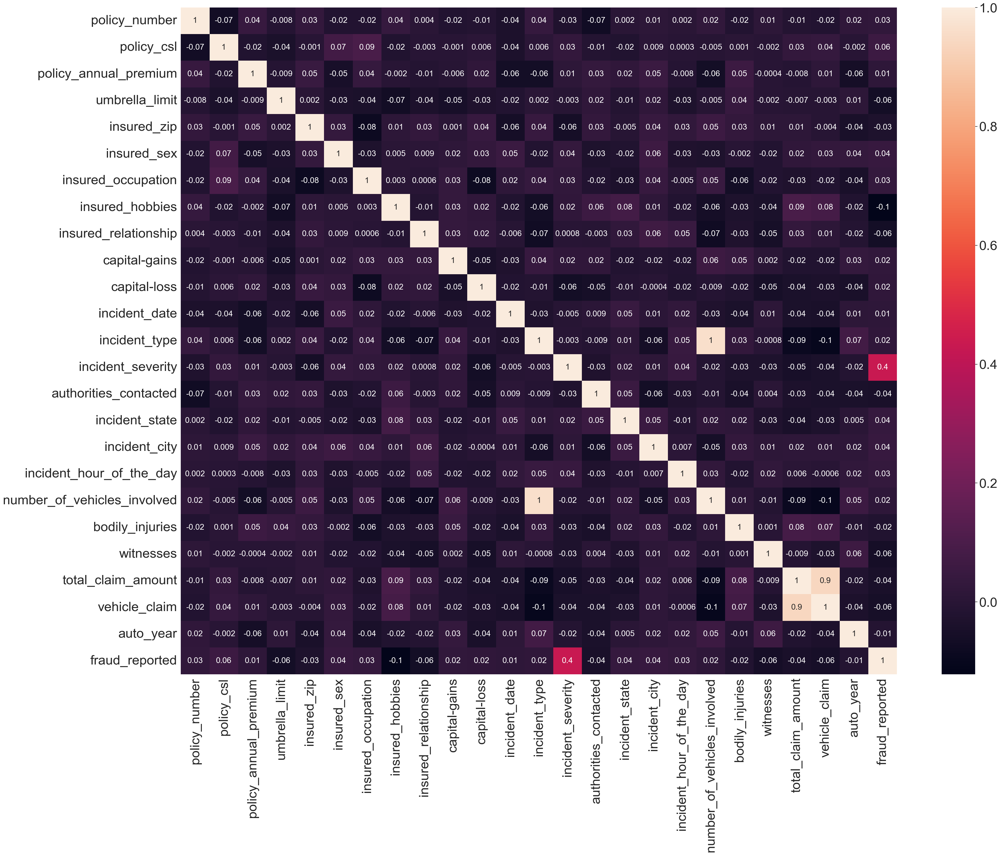

In [41]:
plt.figure(figsize=(40,30))
sns.heatmap(df1.corr(),fmt='.1g',annot=True,annot_kws={'fontsize':20})
sns.set(font_scale=3)

In [42]:
df1.columns

Index(['policy_number', 'policy_csl', 'policy_annual_premium',
       'umbrella_limit', 'insured_zip', 'insured_sex', 'insured_occupation',
       'insured_hobbies', 'insured_relationship', 'capital-gains',
       'capital-loss', 'incident_date', 'incident_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_hour_of_the_day', 'number_of_vehicles_involved',
       'bodily_injuries', 'witnesses', 'total_claim_amount', 'vehicle_claim',
       'auto_year', 'fraud_reported'],
      dtype='object')

In [43]:
# total_claim_amount and vehicle_claim are correlated
df1=df1.drop('total_claim_amount',axis=1)

In [44]:
df1=df1.drop(['auto_year','incident_date','policy_annual_premium'],axis=1)
# contribute very less

In [45]:
sns.set(font_scale=1)

<Figure size 500x500 with 0 Axes>

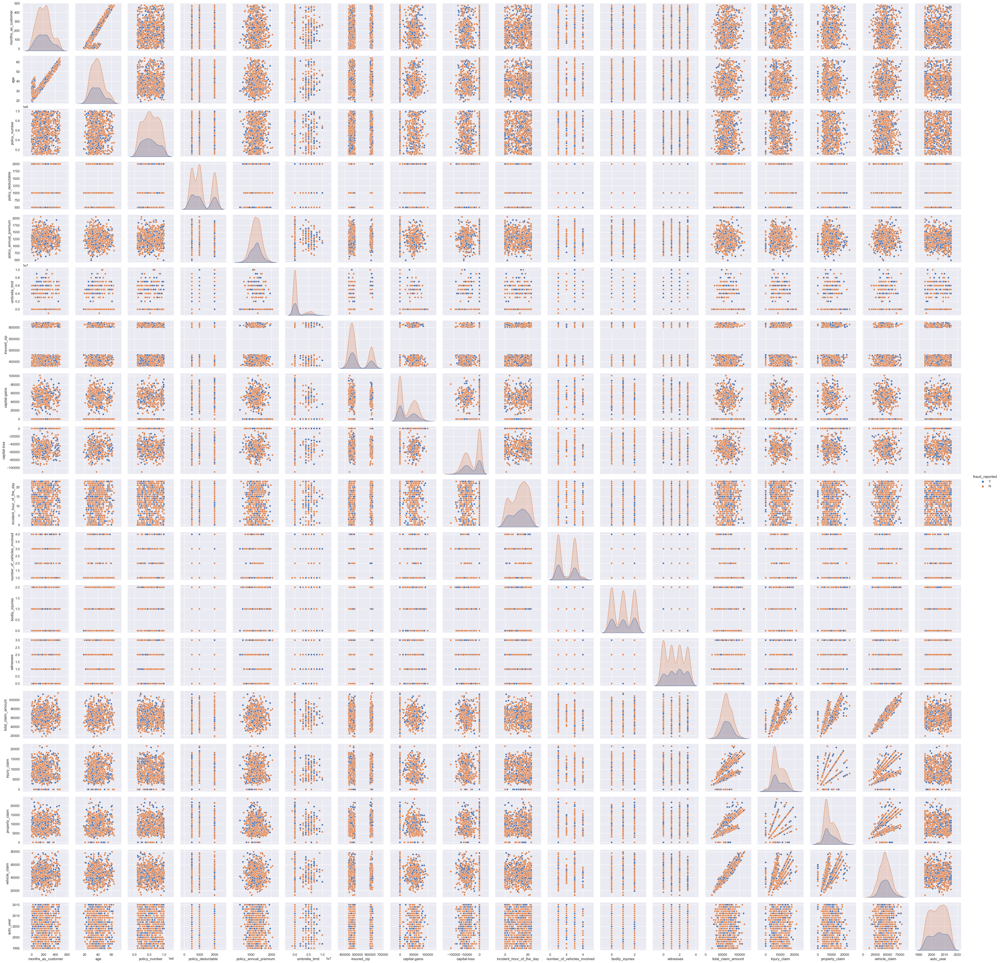

In [46]:
plt.figure(figsize=(5,5))
sns.pairplot(data=df,hue='fraud_reported')
sns.set(font_scale=1)

In [47]:
df1.fraud_reported.value_counts()

1    591
0    231
Name: fraud_reported, dtype: int64

In [48]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 822 entries, 0 to 998
Data columns (total 21 columns):
 #   Column                       Non-Null Count  Dtype
---  ------                       --------------  -----
 0   policy_number                822 non-null    int64
 1   policy_csl                   822 non-null    int64
 2   umbrella_limit               822 non-null    int64
 3   insured_zip                  822 non-null    int64
 4   insured_sex                  822 non-null    int64
 5   insured_occupation           822 non-null    int64
 6   insured_hobbies              822 non-null    int64
 7   insured_relationship         822 non-null    int64
 8   capital-gains                822 non-null    int64
 9   capital-loss                 822 non-null    int64
 10  incident_type                822 non-null    int64
 11  incident_severity            822 non-null    int64
 12  authorities_contacted        822 non-null    int64
 13  incident_state               822 non-null    int64

.

.

.

In [49]:
x=df1.drop('fraud_reported',axis=1)
y=df1.fraud_reported

<Axes: ylabel='fraud_reported'>

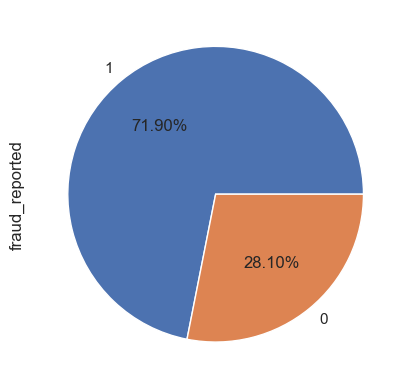

In [50]:
df1.fraud_reported.value_counts().plot.pie(autopct='%.2f%%')

In [51]:
from imblearn.over_sampling import SMOTE
sm = SMOTE()
x1,y1 = sm.fit_resample(x,y)

In [52]:
from sklearn.decomposition import PCA

In [53]:
x1.shape

(1182, 20)

In [54]:
from sklearn.model_selection import train_test_split, cross_val_score
x_train,x_test,y_train,y_test = train_test_split(x1,y1, random_state=42,test_size=0.30)

sc=StandardScaler()
sc.fit(x_train)

x_train_sca = sc.transform(x_train)
x_test_sca = sc.transform(x_test)

In [55]:
from sklearn.ensemble import GradientBoostingClassifier , AdaBoostClassifier , BaggingClassifier , RandomForestClassifier , VotingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression,Lasso
from sklearn.svm import SVC

from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score

import warnings
warnings.filterwarnings('ignore')

.

In [56]:
lr = LogisticRegression()
lr.fit(x_train_sca,y_train)
lry_pred = lr.predict(x_test_sca)

print('Training  : ',lr.score(x_train_sca,y_train))
print('Testing : ',lr.score(x_test_sca,y_test))

print(classification_report(y_test,lry_pred))

recheck = cross_val_score(lr,x,y)
print(recheck)
print(recheck.mean())
print("difference",accuracy_score(y_test,lry_pred) - recheck.mean())

Training  :  0.8198307134220073
Testing :  0.8084507042253521
              precision    recall  f1-score   support

           0       0.78      0.85      0.81       175
           1       0.84      0.77      0.80       180

    accuracy                           0.81       355
   macro avg       0.81      0.81      0.81       355
weighted avg       0.81      0.81      0.81       355

[0.71515152 0.72121212 0.71341463 0.7195122  0.7195122 ]
0.7177605321507761
difference 0.09069017207457608


In [57]:
knn =KNeighborsClassifier()
knn.fit(x_train_sca,y_train)
knny_pred = knn.predict(x_test_sca)

print('Training  : ',knn.score(x_train_sca,y_train))
print('Testing : ',knn.score(x_test_sca,y_test))

print(classification_report(y_test,knny_pred))

recheck = cross_val_score(knn,x,y)
print(recheck)
print(recheck.mean())
print("difference",accuracy_score(y_test,knny_pred) - recheck.mean())

Training  :  0.8246674727932285
Testing :  0.7154929577464789
              precision    recall  f1-score   support

           0       0.66      0.86      0.75       175
           1       0.81      0.57      0.67       180

    accuracy                           0.72       355
   macro avg       0.74      0.72      0.71       355
weighted avg       0.74      0.72      0.71       355

[0.63636364 0.66060606 0.66463415 0.6402439  0.67682927]
0.6557354028085735
difference 0.059757554937905466


In [58]:
gs = GaussianNB()
gs.fit(x_train_sca,y_train)
gsy_pred = gs.predict(x_test_sca)

print('Training  : ',gs.score(x_train_sca,y_train))
print('Testing : ',gs.score(x_test_sca,y_test))

print(classification_report(y_test,gsy_pred))

recheck = cross_val_score(gs,x,y)
print(recheck)
print(recheck.mean())
print("difference",accuracy_score(y_test,gsy_pred) - recheck.mean())

Training  :  0.7980652962515115
Testing :  0.7830985915492957
              precision    recall  f1-score   support

           0       0.78      0.78      0.78       175
           1       0.79      0.78      0.79       180

    accuracy                           0.78       355
   macro avg       0.78      0.78      0.78       355
weighted avg       0.78      0.78      0.78       355

[0.72727273 0.66060606 0.68902439 0.70121951 0.7195122 ]
0.6995269770879528
difference 0.08357161446134298


In [59]:
rfc= RandomForestClassifier(n_estimators=150)
rfc.fit(x_train_sca,y_train)
rfcy_pred = rfc.predict(x_test_sca)

print('Training  : ',rfc.score(x_train_sca,y_train))
print('Testing : ',rfc.score(x_test_sca,y_test))

print(classification_report(y_test,rfcy_pred))

recheck = cross_val_score(rfc,x,y,cv=9)
print(recheck)
print(recheck.mean())
print("difference",accuracy_score(y_test,rfcy_pred) - recheck.mean())
print(confusion_matrix(y_test,rfcy_pred))

Training  :  1.0
Testing :  0.8112676056338028
              precision    recall  f1-score   support

           0       0.80      0.83      0.81       175
           1       0.83      0.79      0.81       180

    accuracy                           0.81       355
   macro avg       0.81      0.81      0.81       355
weighted avg       0.81      0.81      0.81       355

[0.7826087  0.7826087  0.68478261 0.8021978  0.76923077 0.75824176
 0.78021978 0.79120879 0.83516484]
0.7762515262515262
difference 0.03501607938227669
[[145  30]
 [ 37 143]]


In [60]:
rfc_param = {'max_depth':[5,10,15,20],
            'max_features':[5,7,8,'auto'],
            'criterion':['gini','entropy'],
            'min_samples_split':[4,8,16,24],
            'n_estimators':[100,200,300,400,500]}
clf = RandomizedSearchCV(rfc, rfc_param,cv=5)
clf.fit(x_train_sca,y_train)

print(clf.best_score_)
print(clf.best_params_)

0.8343117926250455
{'n_estimators': 500, 'min_samples_split': 4, 'max_features': 'auto', 'max_depth': 20, 'criterion': 'entropy'}


In [61]:
abc =AdaBoostClassifier()
abc.fit(x_train_sca,y_train)
abcy_pred = abc.predict(x_test_sca)

print('Training  : ',abc.score(x_train_sca,y_train))
print('Testing : ',abc.score(x_test_sca,y_test))

print(classification_report(y_test,abcy_pred))

recheck = cross_val_score(abc,x,y,cv=15)
print(recheck)
print(recheck.mean())
print("difference",accuracy_score(y_test,abcy_pred) - recheck.mean())

Training  :  0.8657799274486094
Testing :  0.8028169014084507
              precision    recall  f1-score   support

           0       0.79      0.82      0.80       175
           1       0.82      0.79      0.80       180

    accuracy                           0.80       355
   macro avg       0.80      0.80      0.80       355
weighted avg       0.80      0.80      0.80       355

[0.74545455 0.72727273 0.81818182 0.67272727 0.76363636 0.69090909
 0.8        0.83636364 0.72727273 0.76363636 0.72727273 0.85454545
 0.83333333 0.7962963  0.7962963 ]
0.7702132435465769
difference 0.0326036578618738


In [62]:
gbcbest = GradientBoostingClassifier()
gbcbest.fit(x_train_sca,y_train)
gbcy_pred = gbcbest.predict(x_test_sca)

print('Training  : ',gbcbest.score(x_train_sca,y_train))
print('Testing : ',gbcbest.score(x_test_sca,y_test))

print(classification_report(y_test,gbcy_pred))

recheck = cross_val_score(gbcbest,x,y,cv=12)
print(recheck)
print(recheck.mean())
print("difference",accuracy_score(y_test,gbcy_pred) - recheck.mean())

Training  :  0.9528415961305925
Testing :  0.8422535211267606
              precision    recall  f1-score   support

           0       0.82      0.87      0.85       175
           1       0.87      0.81      0.84       180

    accuracy                           0.84       355
   macro avg       0.84      0.84      0.84       355
weighted avg       0.84      0.84      0.84       355

[0.79710145 0.82608696 0.75362319 0.75362319 0.7826087  0.82608696
 0.77941176 0.79411765 0.76470588 0.88235294 0.88235294 0.85294118]
0.8079177323103154
difference 0.03433578881644517


In [63]:
bc = BaggingClassifier()
bc.fit(x_train_sca,y_train)
bcy_pred = bc.predict(x_test_sca)

print('Training  : ',bc.score(x_train_sca,y_train))
print('Testing : ',bc.score(x_test_sca,y_test))

print(classification_report(y_test,bcy_pred))

recheck = cross_val_score(bc,x,y,cv=5)
print(recheck)
print(recheck.mean())
print("difference",accuracy_score(y_test,bcy_pred) - recheck.mean())

Training  :  0.9903264812575574
Testing :  0.8084507042253521
              precision    recall  f1-score   support

           0       0.78      0.85      0.81       175
           1       0.84      0.77      0.80       180

    accuracy                           0.81       355
   macro avg       0.81      0.81      0.81       355
weighted avg       0.81      0.81      0.81       355

[0.83636364 0.79393939 0.83536585 0.83536585 0.86585366]
0.8333776792313378
difference -0.02492697500598562


In [64]:
dtc= DecisionTreeClassifier(min_samples_split= 24, max_features= 8, max_depth= 5, criterion= 'gini')
dtc.fit(x_train_sca,y_train)
dtcy_pred = dtc.predict(x_test_sca)

print('Training  : ',dtc.score(x_train_sca,y_train))
print('Testing : ',dtc.score(x_test_sca,y_test))

print(classification_report(y_test,dtcy_pred))

recheck = cross_val_score(dtc,x,y,cv=11)
print(recheck)
print(recheck.mean())
print("difference",accuracy_score(y_test,dtcy_pred) - recheck.mean())

Training  :  0.8270858524788391
Testing :  0.7633802816901408
              precision    recall  f1-score   support

           0       0.74      0.81      0.77       175
           1       0.79      0.72      0.76       180

    accuracy                           0.76       355
   macro avg       0.77      0.76      0.76       355
weighted avg       0.77      0.76      0.76       355

[0.70666667 0.84       0.66666667 0.78666667 0.74666667 0.8
 0.74666667 0.68       0.82432432 0.87837838 0.78378378]
0.7690745290745291
difference -0.005694247384388285


In [65]:
dtc_param = {'max_depth':[5,10,15,20],
            'max_features':[5,7,8,'auto'],
            'criterion':['gini','entropy'],
            'min_samples_split':[4,8,16,24]
            }
clf = RandomizedSearchCV(dtc, dtc_param,cv=5)
clf.fit(x_train_sca,y_train)

print(clf.best_score_)
print(clf.best_params_)

0.7823074114640379
{'min_samples_split': 16, 'max_features': 7, 'max_depth': 5, 'criterion': 'entropy'}


In [66]:
dtc= DecisionTreeClassifier(criterion= 'entropy', max_depth= 10, max_features='auto', min_samples_split= 4)
dtc.fit(x_train_sca,y_train)
dtcy_pred = dtc.predict(x_test_sca)

print('Training  : ',dtc.score(x_train_sca,y_train))
print('Testing : ',dtc.score(x_test_sca,y_test))

print(classification_report(y_test,dtcy_pred))

recheck = cross_val_score(dtc,x,y,cv=12)
print(recheck)
print(recheck.mean())
print("difference",accuracy_score(y_test,dtcy_pred) - recheck.mean())

Training  :  0.9540507859733979
Testing :  0.6816901408450704
              precision    recall  f1-score   support

           0       0.67      0.70      0.68       175
           1       0.69      0.67      0.68       180

    accuracy                           0.68       355
   macro avg       0.68      0.68      0.68       355
weighted avg       0.68      0.68      0.68       355

[0.79710145 0.69565217 0.71014493 0.71014493 0.75362319 0.73913043
 0.64705882 0.63235294 0.55882353 0.72058824 0.76470588 0.67647059]
0.7004830917874396
difference -0.018792950942369213


## VotingClassifier

In [67]:
classifier = [('RandomForestClassifier',rfc),('GradientBoostingClassifier',gbcbest),('BaggingClassifier',bc)]
vc= VotingClassifier(estimators=classifier)
vc.fit(x_train_sca,y_train)
vcy_pred = vc.predict(x_test_sca)

print('Training  : ',vc.score(x_train_sca,y_train))
print('Testing : ',vc.score(x_test_sca,y_test))

print(classification_report(y_test,vcy_pred))

recheck = cross_val_score(vc,x,y,cv=5)
print(recheck)
print(recheck.mean())
print("difference",accuracy_score(y_test,vcy_pred) - recheck.mean())

Training  :  0.9951632406287787
Testing :  0.828169014084507
              precision    recall  f1-score   support

           0       0.81      0.86      0.83       175
           1       0.85      0.80      0.83       180

    accuracy                           0.83       355
   macro avg       0.83      0.83      0.83       355
weighted avg       0.83      0.83      0.83       355

[0.79393939 0.74545455 0.79268293 0.80487805 0.85365854]
0.7981226903178122
difference 0.030046323766694805


# VotingClassifier is best because the difference is very low and no over/under fitting

In [68]:
import joblib
joblib.dump(vc,'Automobile_insurance_fraud.obj')

['Automobile_insurance_fraud.obj']